**Important!**

Before diving into the tutorial, we will create a new conda environment for it. To do this, open the terminal, change the directory to the tutorial folder, and enter the following command:


1. Open the terminal.

2. Type **cd /path/to/tutorial/folder/**

3. Type **conda env create --name tutorial --file=requirements.yml**

The last command will create an environment named 'tutorial' with all the necessary libraries for today. Once the installation is complete, activate the environment and restart the kernel.

# Eigenworms
> This tutorial is prepared by Irina Korshok. The material is based on BingKan Xue, PHZ4710 - Introduction to Biological Physics, University of Florida

In this notebook, we will use "dimensionality reduction" methods to study animal behavior. As one can imagine, behavior can be highly complex. In some animals, biologists have classified behavior by stereotypical postures or movements that they have defined based on experience. Recent technology, such as high-resolution and high-speed digital camera, has allowed us to take a more quantitative approach by collecting data on behavior. However, the data will most likely be high dimensional, as they may represent the color of each pixel, or the position of each body part, etc. Our goal is to see if we can simplify such high-dimensional representation to a much lower dimensional description, and perhaps these "principal" dimensions would match the stereotypical behaviors that were found "manually". Thus, we look for an automated and unbiased way of reducing the dimensionality of data to help us extract the basic modes of behavior.

Our example here is the crawling behavior of the roundworm, *C. elegans*. In the experiment of ([Stephens et al., 2008](https://doi.org/10.1371/journal.pcbi.1000028)), the worms were placed on a plate to crawl around, and their motion was recorded from above using a microscope and digital camera at a rate of 4 frames per second. A typical image looks like the following:  

<img src="demonstration/O0027.jpg" alt="original image" align="middle" width="200"/>
<img src="demonstration/F0027.png" alt="processed image" align="middle" width="200"/>


The goal is to extract the posture of the worm. There are multiple ways to process images, including leveraging pixel information directly. However, this approach seems redundant in our case, as the worm has a simple shape—a round tube with a relatively constant width and length. We can draw a center curve along the body to represent its shape in each frame. This curve can be described by an array of x and y coordinates for the points along the line. Additionally, the curve is invariant to translation and rotation. Therefore, we should use egocentric or local coordinates relative to the worm's body, rather than the absolute x-y coordinates of the endpoints. A reasonable choice for representation is the angles of the segments, as shown below:

<img src="demonstration/Stephens2008_Fig1mod.jpg" alt="Stephens2008_Fig1" align="middle" width="800"/>

The data used in this tutorial define the posture as 100 consecutive angles along the curve, resulting in a 100-dimensional representation of the worm's posture. However, this does not mean that our data is truly 100-dimensional. In fact, by applying dimensionality reduction methods, we will demonstrate that the intrinsic dimensionality of the worm's shape is lower -- approximately 4 dimensions.

## Principal Component Analysis

The body posture is primarily captured by the number of points or angles between these points. The general location of these points can be informed by animal anatomy, such as limb joints or repetitive segments on the body, but this is not always straightforward. In the case of C. elegans, there are no visible anatomical features to serve as key points, making the choice of 100 angles across the body somewhat arbitrary; it could just as easily be 120 or 80. The number of variables determines the dimensionality of the problem, and we want to avoid making the description excessively complicated. At the same time, we do not want to oversimplify, as this could result in the loss of valuable information. Is there a way to determine how many body points or angles are sufficient to retain?

One way to think about this is to remember that the body points are not entirely independent variables; they are connected by underlying muscle and skeletal structures. As a result, they can move together or remain stationary. In other words, some variables can co-vary, while others do not. We are particularly interested in the variables that do not co-vary, as they provide the most informative insights.

To determine which variables co-vary, we can apply a linear dimensionality reduction technique called Principal Component Analysis (PCA). To illustrate this concept, we will consider a test dataset.



Let's import the required libraries for the tutorial.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as anim
import plotly
import plotly.graph_objs as go

Now, let's upload the demo.

In [2]:
#test data
example_data = np.loadtxt("demonstration/data.csv",delimiter=",")
print(f'number of data points = {example_data.shape[0]}, dimension = {example_data.shape[1]}')

number of data points = 100, dimension = 3


We can see that the test data has 3 dimensions—3 variables. We can visualize this 3-dimensional data using the code below. You can rotate the plot to explore the dataset further.

In [3]:
plotly.offline.init_notebook_mode()
# Configure the trace.
trace = go.Scatter3d(
    x=example_data[:,0],
    y=example_data[:,1],
    z=example_data[:,2],
    mode='markers',
    marker={
        'size': 3,
        'opacity': 0.8,
        'color':"lightcoral"
    }
)
# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)
data = [trace]
plot_figure = go.Figure(data=data, layout=layout)
# Render the plot.
plotly.offline.iplot(plot_figure) #for VSCode
#plot_figure.show(renderer="iframe") #for jupyter notebook

The data are embedded in 3-dimensional space; however, most of the points lie on a 2-dimensional plane. This indicates that, despite being described by 3 variables, the data are effectively 2-dimensional, with a small number of outliers. To reduce the number of variables from 3 to 2, all that’s needed is to rotate the axes so that the points align with the plane. PCA essentially identifies this optimal rotation. You may notice that the points are spread across the plane but not in the perpendicular direction—variability in that direction is minimal. PCA illustrates the magnitude of variation in each direction, allowing you to disregard those directions where variation is negligible.

The dataset above is a simple example. In most cases, you cannot directly visualize the data to identify the low-dimensional structure. We will move on to the 100-dimensional processed data of the crawling wild-type (N2) worm to explore how to handle such situations.

In [4]:
filename = "data/shapes.csv"
data = np.loadtxt(filename, dtype= 'float', delimiter=",")

In [5]:
N = data.shape[0]    # number of data points
D = data.shape[1]    # number of dimensions
print(f'number of data points N = {N}, dimension D = {D}')

number of data points N = 6655, dimension D = 100


The loaded file contains a 2D array of shape (6655, 100), where each row represents one frame. We can think of each data point as a point in a $D$-dimensional space, with $N$ such points in that space.

The first step in PCA is to calculate the covariance matrix. Let the data be denoted by $X_{ni}$, where $n = 1, \dots, N$ are the indices of the data points and $i = 1, \dots, D$ are the indices of the components. The covariance matrix is given by the next expression:
\begin{equation}
C_{ij} = \frac{1}{N} \sum_{n=1}^{N} (X_{ni} - \bar{X}_i) (X_{nj} - \bar{X}_j)
\end{equation}
where $\bar{X}_i$ is the mean values of all data points given by:
\begin{equation}
\bar{X}_i = \frac{1}{N} \sum_{n=1}^{N} X_{ni}
\end{equation}
The covariance matrix is a $(D \times D)$ matrix, whose diagonal elements are the variance of the data points along each axis, and the off-diagonal elements are the covariance between two components. 

**Important:** We need to subtract the mean from each variable. However, we do not standardize the data; we don't need to make the variance of every variable equal to one, as is commonly done in data science. Variables can have different variances due to animal anatomy or as a characteristic of the behavior being analyzed. Normalizing the variance would result in the loss of these important features.

We can calculate the covariance matrix as follows:

In [6]:
x_mean = np.mean(data, axis=0)    # mean over data points
x_cent = data - x_mean    # centered data
cov = np.dot(x_cent.T, x_cent) / N    # covariance matrix

Let's visualize the covariance matrix using a color plot:

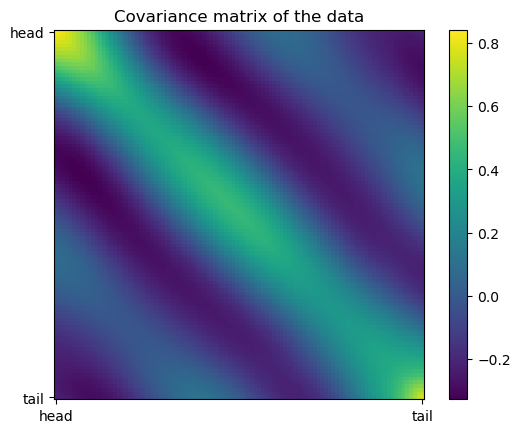

In [7]:
plt.figure()
plt.imshow(cov)
plt.xticks([0,99],["head","tail"])
plt.yticks([0,99],["head","tail"])
plt.title("Covariance matrix of the data")
plt.colorbar()
plt.show()

There is a clear structure in the covariance matrix. The diagonal elements indicate the variance of the angles, showing that the variance at the head and tail is greater than that along the body. The off-diagonal terms represent the covariance between different angles. This structure arises from the correlations between neighboring angles. These correlations exist because the measured angles are located along the worm's body, and the variance of these angles is influenced by the smooth, wave-like movements of the body.

To illustrate this, let's break correlations by randomly shuffling the angles in the posture. Caould you guess what will happen?

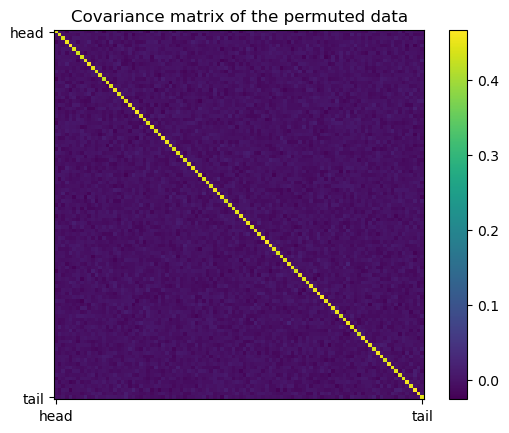

In [8]:
rng = np.random.default_rng()
shuffled_data = rng.permuted(data, axis=1)

x_mean_shuffled = np.mean(shuffled_data, axis=0) 
x_cent_shuffled = shuffled_data - x_mean_shuffled
cov_shuffled = np.dot(x_cent_shuffled.T, x_cent_shuffled) / N 

plt.figure()
plt.imshow(cov_shuffled)
plt.xticks([0,99],["head","tail"])
plt.yticks([0,99],["head","tail"])
plt.title("Covariance matrix of the permuted data")
plt.colorbar()
plt.show()

As you can see, there is no longer any structure in the covariance matrix. Furthermore, there is no difference in variance between the head and the tail due to the mixing of the angles.

The clear structure of the original covariance matrix suggests that the data points have larger variation in certain directions than others. However, the largest variations may not be as simple as being along some basis axes of the space. The next step in PCA is to rotate the axes and find the directions of most variation. These directions are suggested by the covariance matrix, meaning, its eigenvectors with largest eigenvalues. We can calculate the eigenvalues and eigenvectors using the `numpy.linalg.eig` function. (Note that, because the covariance matrix is real and symmetric, all eigenvalues and eigenvectors are real. This allows us to use the `eigh` function instead.)

In [9]:
w, v = np.linalg.eigh(cov)    # find eigenvalues and eigenvectors of a real symmetric matrix

sort = np.argsort(w)[::-1]    # sort eigenvalues from largest to smallest
w = w[sort]
v = v[:,sort]    # sort eigenvectors accordingly

Each eigenvector represents the direction of variance, and every eigenvalue is associated with the fraction of the entire variance covered by this eigenvector. To make it interpretable, let's normalize the eigenvalues by their sum -- compute cumulative variance.

In [10]:
w = w / np.sum(w)    # normalized eigenvalues = variance along each principal component
wsum = np.cumsum(w)    # cumulative sum of normalized eigenvalues = variance captured

Let's plot the sorted eigenvalues and cumulative variance.

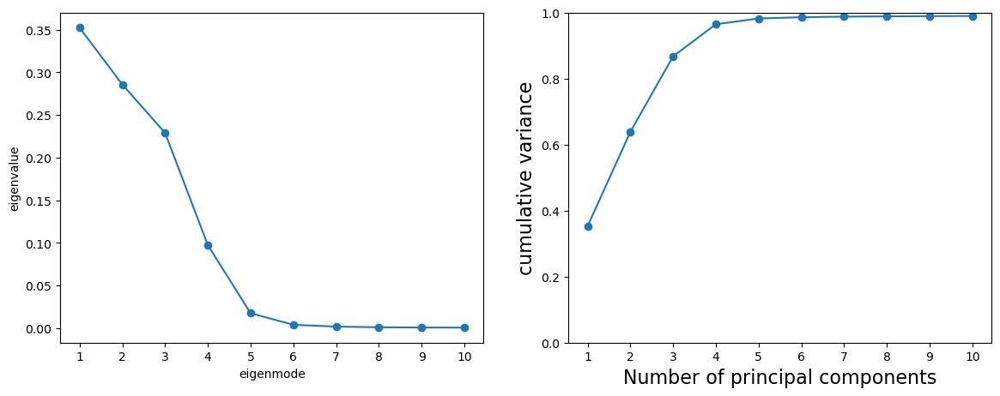

In [11]:
fig, ax = plt.subplots(1,2, figsize=(14,5))
ax[0].plot(w[:10],marker="o",linestyle="-")
ax[0].set_xlabel('eigenmode')
ax[0].set_ylabel('eigenvalue')
ax[0].set_xticks(np.arange(0,10,1),np.arange(1,11,1))

ax[1].plot(np.arange(1,11), wsum[:10], 'o-')
ax[1].set_ylim(0, 1)
ax[1].set_xticks(np.arange(1,11))
ax[1].set_xlabel('Number of principal components', fontsize=16)
ax[1].set_ylabel('cumulative variance', fontsize=16)

plt.show()

The eigenmodes are referred to as "principal components" (PCs). As you can see, 4 PCs capture over 96% of the variance present in the data. This means we can disregard the remaining eigenmodes without sacrificing much accuracy in our description of the data. Therefore, we can project our 100-dimensional data into a 4-dimensional space.

It is good to remember two things:

1. Even a clear structure in the covariance matrix does not guarantee a low-dimensional representation in principal component (PC) space. The data can be inherently high-dimensional or nonlinear. In such cases, linear techniques like PCA may not perform well. The covariance matrix below serves as an example. The data used here represent the axial body deformations of crawling fruit fly maggots. The covariance matrix shows a clear structure: there is a cluster in the front segments and low covariance among neighboring segments (the components closest to the diagonal). However, to capture 90% of the variance, we need to consider nearly all PCs. One interpretation of this effect is that the axial wave traveling from tail to head is localized. ([Heckscher et al., 2012](https://doi:10.1523/JNEUROSCI.0222-12.2012)). This observation can be used for testing concepts with models ([Pehlevan et al., 2016]( https://doi.org/10.7554/eLife.11031), [Gorbushin, 2021](https://doi.org/10.1103/PhysRevE.103.042411)).

<div align="center">
<video src="demonstration/video_maggots.mp4" align="middle" width="1200" controls>  </video>
</div>

2. There is no fundamental cut-off in the data. The question of how many PCs to keep does not have a unique answer; in our case, we could choose either 3 or 5. To determine a sufficient number of PC modes, we can use practical judgment: how well do projections onto the PCs reconstruct the data?

To start with, let's figure out how to convert the 100-dimensional angles to the posture.


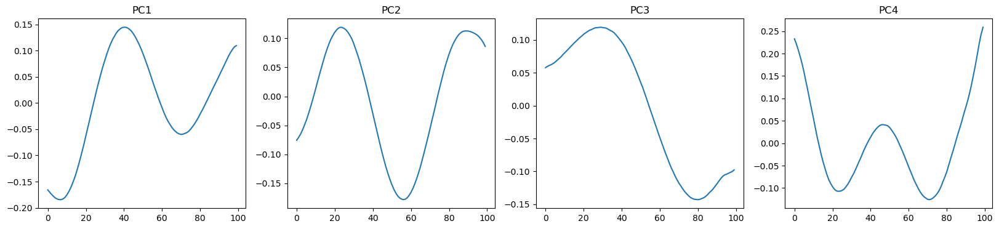

In [12]:
K = 4    # number of principal components to use
PC = v[:,:K]    # eigenvectors for these PCs; each column is one PC

fig, ax = plt.subplots(1,K, figsize=(5*K,4))
for i in range(K):
    ax[i].plot(PC[:,i])
    ax[i].set_title(f'PC{i+1}')
plt.show()

Remember that these are vectors in a 100-dimensional space representing the angles of consecutive segments along the worm's body, rather than the postures themselves. We can use these vectors as new basis vectors to decompose any shape of the worm (represented by a 100-dimensional vector of angles) into its components. In other words, the shape of the worm can be described as a linear combination of these 'eigenworms.

To visualize the shape of these eigenworms, we need to convert the angles of consecutive segments back to the positions of the endpoints. This can be accomplished using the following function.

In [13]:
def angle2pos(angles):
    """
    convert from angles of consecutive segments of unit length to positions of their endpoints.
    inputs:
    angles: 1-d array, angles of consecutive segments.
    outputs:
    pos: 2-d array, each row is (x,y) coordinates of an endpoint, centered at zeros.
    """
    angles = x_mean + angles
    dx = np.cos(angles)
    dy = np.sin(angles)
    xsum = np.cumsum(dx)
    ysum = np.cumsum(dy)
    pos = np.zeros((D+1, 2))
    pos[1:,0] = xsum
    pos[1:,1] = ysum
    mean = np.mean(pos, axis=0)
    pos = pos - mean
    return pos

We can now plot the eigenworms in the physical space. To see appreciable shapes, we will multiply each mode by an amplitude, set to 5.

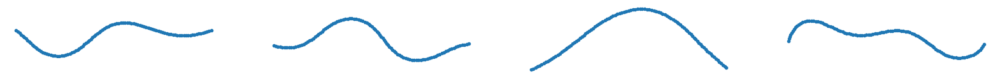

In [14]:
pos_all = []
for i in range(K):
    pos = angle2pos(PC[:,i]*5)   # convert PC (with amplitude 5) to positions
    pos_all.append(pos)

fig, ax = plt.subplots(1,K, figsize=(5*K,4))
for i in range(K):
    pos = pos_all[i]
    ax[i].plot(pos[:,0], pos[:,1], '.-')
    ax[i].set_aspect('equal')
    ax[i].axis('off')
plt.show()

This is how PC look in the physical space. Let's now reconstruct the original postures of the worm from projections onto PC space. The projections are given by:
\begin{equation}
A_{nk} = \sum_{i} X_{ni} v_{ik}
\end{equation}
where `v` is the 2-d array returned by the `eigh()` function, each column of which is an eigenvector. We only need to calculate the first few components, $k = 1, \cdots, K$. The reconstructed data are given by:
\begin{equation}
\hat{X}_{ni} = \sum_{k=1}^{K} A_{nk} v_{ik} = \sum_{k=1}^{K} A_{nk} \big( v^\top \big)_{ki}
\end{equation}

In [15]:
x_project = np.dot(x_cent, PC)    # project (centered) data onto principal components
x_reconstruct = np.dot(x_project, PC.T) + x_mean    # reconstruct data from the projections

Let us plot both the original and the reconstructed shape of a worm.

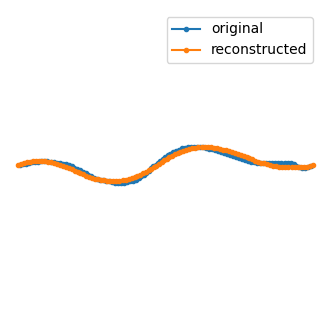

In [16]:
pos_original = angle2pos(data[0,:])    # original data from one frame
pos_reconstruct = angle2pos(x_reconstruct[0,:])    # reconstructed data

plt.figure(figsize=(4,4))
plt.plot(pos_original[:,0], pos_original[:,1], '.-', label='original')
plt.plot(pos_reconstruct[:,0], pos_reconstruct[:,1], '.-', label='reconstructed')
plt.xlim(-50, 50)
plt.ylim(-50, 50)
plt.legend()
plt.axis('off')
plt.show()

It appears that our reconstruction closely matches the original shape. The small discrepancies arise from our neglecting the 'higher-order' modes in the decomposition. Nevertheless, the reduced representation is much more concise (as well as space-saving and faster to process on computers), while still being accurate enough for further studies on worm behavior. For example, it can be used to compare crawling behavior across different developmental stages of *C. elegans* and to capture differences among behavioral motifs (as in  [Hassinan et al., 2024](https://doi.org/10.1371/journal.pcbi.1011906)).

Timeseries in PC space form trajectories, which correspond to a certain behavior motifs. Different behavior motifs can form different trajectories. Let's see how crawling look in the space of the first two components. What does the form of trajectories tell us?

**Important:** we can normalize the variance of the projected data for solely visualization purposes.

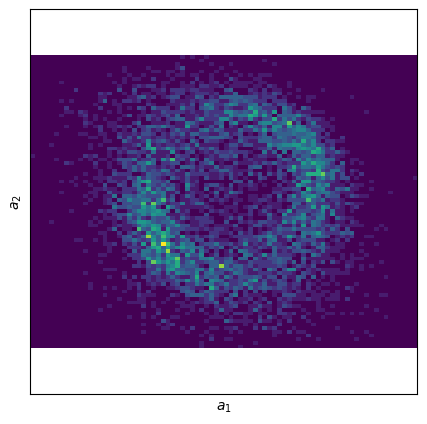

In [17]:
plt.figure(figsize=(5,5))
plt.hist2d(x_project[:,0],x_project[:,1],bins=80)
plt.axis("equal")
plt.xticks([],[])
plt.yticks([],[])
plt.xlabel("$a_1$")
plt.ylabel("$a_2$")
plt.show()

Finally, let's animate the projections to visualize crawling behavior. What is going on in this movie?

In [18]:
plt.rcParams["animation.html"] = "jshtml"
plt.rcParams['animation.embed_limit'] = 2**64
start = 0
end = 150
time = np.arange(0,N/4.,1./4.) #visualization time

fig, axes = plt.subplot_mosaic("ABD;CBD",figsize=(15,5))

#PC1
pA1, = axes["A"].plot(time,x_project[:,0],color="g")
pA2, = axes["A"].plot(time[start],x_project[start,0],color="k",marker="o")
axes["A"].set_xlim([start/4,end/4])
axes["A"].set_title("$a_1$")
axes["A"].xaxis.set_visible(False)

#PC2
pC1, = axes["C"].plot(time, x_project[:,1] ,color="b")
pC2, = axes["C"].plot(time[start],x_project[start,1],color="k",marker="o")
axes["C"].set_xlim([start/4,end/4])
axes["C"].set_title("$a_2$")
axes["C"].set_xlabel("time, sec")

#RECONSTRUCTION
pos_original = angle2pos(data[start,:]) 
pos_reconstruct = angle2pos(x_reconstruct[start,:])  
pD2, = axes["D"].plot(pos_original[:,0],pos_original[:,1],marker=".",label="original",linewidth=6,markersize=15)
pD1, = axes["D"].plot(pos_reconstruct[:,0],pos_reconstruct[:,1],marker=".",label="reconstructed",linewidth=6,markersize=15)
axes["D"].legend()
axes["D"].axis("equal")
axes["D"].axis("off")

#PROJECTION
pB1 = axes["B"].hist2d(x_project[:,0],x_project[:,1],bins=80)
pB2, = axes["B"].plot(x_project[start,0],x_project[start,1],marker="o",color="red")
axes["B"].axis("equal")
axes["B"].set_xticks([],[])
axes["B"].set_yticks([],[])
axes["B"].set_xlabel("$a_1$")
axes["B"].set_ylabel("$a_2$")

def animate(t):
    pA2.set_data([time[t]],[x_project[t,0]])
    pC2.set_data([time[t]],[x_project[t,1]])
    

    pos_original = angle2pos(data[t,:]) 
    pos_reconstruct = angle2pos(x_reconstruct[t,:])  
    pD2.set_data(pos_original[:,0],pos_original[:,1])
    pD1.set_data(pos_reconstruct[:,0],pos_reconstruct[:,1])
    

    pB2.set_data([x_project[t,0]],[x_project[t,1]])
   
    return (pA2,pC2,pD1,pD2,pB2)

mov = anim.FuncAnimation(fig, animate, frames=range(start+1,end), interval=250) #interval in ms
plt.close()

In [19]:
mov